In [16]:
import numpy as np
import pandas as pd
import cv2
import sys
import os
from tqdm import tqdm
import matplotlib.pyplot as plt
import urllib
from sklearn.model_selection import train_test_split

import tensorflow as tf

In [17]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Read Places 365 dataset in LAB format

In [18]:
# !wget http://data.csail.mit.edu/places/places365/val_256.tar

In [19]:
# !ls

In [20]:
!tar -xvf "gdrive/My Drive/Kaggle/ImageColorization/Places_365_Validation.tar"

Streaming output truncated to the last 5000 lines.
val_256/Places365_val_00024446.jpg
val_256/Places365_val_00016351.jpg
val_256/Places365_val_00008696.jpg
val_256/Places365_val_00021318.jpg
val_256/Places365_val_00035754.jpg
val_256/Places365_val_00019584.jpg
val_256/Places365_val_00007043.jpg
val_256/Places365_val_00015991.jpg
val_256/Places365_val_00019223.jpg
val_256/Places365_val_00010968.jpg
val_256/Places365_val_00027553.jpg
val_256/Places365_val_00027921.jpg
val_256/Places365_val_00015244.jpg
val_256/Places365_val_00006603.jpg
val_256/Places365_val_00034114.jpg
val_256/Places365_val_00014404.jpg
val_256/Places365_val_00014876.jpg
val_256/Places365_val_00026313.jpg
val_256/Places365_val_00018811.jpg
val_256/Places365_val_00018463.jpg
val_256/Places365_val_00031373.jpg
val_256/Places365_val_00003816.jpg
val_256/Places365_val_00003464.jpg
val_256/Places365_val_00023174.jpg
val_256/Places365_val_00011663.jpg
val_256/Places365_val_00002224.jpg
val_256/Places365_val_00007908.jpg
val_

In [21]:
home = "val_256"
image_paths = [home+"/"+x for x in os.listdir(home)]
print("Total images:", len(image_paths))

Total images: 36500


Image Min Max: 0 255
L Min Max: 0 255
A Min Max: 108 180
B Min Max: 88 171


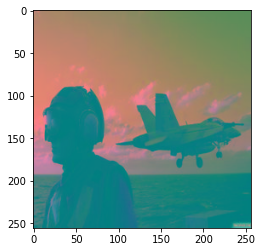

In [22]:
temp_img = cv2.imread(b'val_256/Places365_val_00019899.jpg'.decode("utf-8"), cv2.IMREAD_COLOR)
temp_img = cv2.cvtColor(temp_img, cv2.COLOR_BGR2LAB)
# temp_img = read_img_lab('val_256/Places365_val_00019899.jpg')
print("Image Min Max:", np.min(temp_img), np.max(temp_img))
print("L Min Max:", np.min(temp_img[:,:,0]), np.max(temp_img[:,:,0]))
print("A Min Max:", np.min(temp_img[:,:,1]), np.max(temp_img[:,:,1]))
print("B Min Max:", np.min(temp_img[:,:,2]), np.max(temp_img[:,:,2]))
plt.imshow(temp_img)
plt.show()

In [23]:
def shuffle(X, Y=None):
    X = np.array(X)
    if Y is not None:
      Y = np.array(Y)
    ids = np.random.permutation(np.arange(len(X)))
    X = X[ids]
    if Y is not None:
        Y = Y[ids]
    return X,Y

In [24]:
def read_img_lab(img_path, image_shape=(128,128)):
  if type(img_path).__name__ == "bytes":
    img_path = img_path.decode("utf-8")
  temp_img = cv2.imread(img_path, cv2.IMREAD_COLOR)
  temp_img = cv2.cvtColor(temp_img, cv2.COLOR_BGR2LAB)
  temp_img = cv2.resize(temp_img, (image_shape[1], image_shape[0]))
  return temp_img

In [25]:
def lab_data_generator(image_paths, image_shape, batch_size, normalize=True):
  num_batches = len(image_paths) // batch_size 
  while True:
    image_paths, _ = shuffle(image_paths)
    for batch_i in range(num_batches):
      start = batch_i * batch_size
      end = (batch_i + 1) * batch_size
      cur_image_paths = image_paths[start:end]
      lab_images = []
      for path in cur_image_paths:
        lab_image = read_img_lab(path, image_shape)
        if lab_image is None:
          continue
        lab_images.append(lab_image)
      lab_images = np.array(lab_images)
      if normalize:
        lab_images = lab_images / 255.0
      L = lab_images[:,:,:,0]
      L = L.reshape(L.shape[0], L.shape[1], L.shape[2], 1)
      AB = lab_images[:,:,:,1:3]
      yield L.astype(np.float32), AB.astype(np.float32)

In [26]:
image_paths_train, image_paths_val = train_test_split(image_paths, test_size=0.2)
print("Train image paths:", len(image_paths_train))
print("Val image paths:", len(image_paths_val))

Train image paths: 29200
Val image paths: 7300


In [27]:
# a = tf.data.Dataset.from_generator(lab_data_generator, args=[image_paths, (128,128), 4, True], output_types=(tf.float32, tf.float32))
# for x,y in a.take(2):
#   print(x.shape, y.shape)

# Load LAB Image Colorization dataset --Not In Use--

In [28]:
# home = "gdrive/My Drive/Kaggle/ImageColorization"

In [29]:
# os.listdir(home+"/ab/ab")

## 1. Load AB data

In [30]:
# AB1 = np.load(home+"/ab/ab/ab1.npy")
# # AB2 = np.load(home+"/ab/ab/ab2.npy")
# # AB3 = np.load(home+"/ab/ab/ab3.npy")

# # AB = np.concatenate([AB1, AB2, AB3], axis=0)
# AB = AB1
# print("AB.shape:",AB.shape)

## 2. Load L data

In [31]:
# L = np.load(home+"/l/gray_scale.npy")
# L = L[:len(AB)]
# L.shape

# Create Data Generator

In [32]:
# def data_generator(L, AB, AB_min, AB_max, batch_size, normalize=True):  
#   num_batches = int(np.ceil(len(L)/batch_size))
#   while True:
#     L, AB = shuffle(L, AB)
#     for batch_i in range(num_batches):
#       start = batch_i * batch_size
#       end = (batch_i + 1) * batch_size
#       X = L[start:end]
#       Y = AB[start:end]
#       if normalize:
#         X = X / 255.0
#         Y = (Y - AB_min) / (AB_max - AB_min)
#       yield X, Y


In [33]:
# AB_min = np.min(AB)
# AB_max = np.max(AB)

In [34]:
# data_gen=data_generator(L, AB, AB_min, AB_max, 2)

# Create Model

In [35]:
def model_autoencoder(input_shape, opt, loss,output_activation, num_color_bins=10):
  # Encoder is pretrained VGG.
  # vgg_input = tf.keras.layers.Input(shape=input_shape)
  # vgg_input_cnn = tf.keras.layers.Conv2D(3, kernel_size=5, padding="same")(vgg_input)
  # model_vgg = tf.keras.applications.VGG16(include_top=False)
  # model_vgg.trainable = False
  # vgg_output = model_vgg(vgg_input_cnn)
  #encoder = tf.keras.Model(inputs=[vgg_input], outputs=[vgg_output])

  # Custom Encoder.
  input_ = tf.keras.Input(shape=input_shape)

  x = tf.keras.layers.Conv2D(64, kernel_size=3, strides=2, padding="same")(input_)
  x = tf.keras.layers.ReLU()(x)
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)

  x = tf.keras.layers.Conv2D(128, kernel_size=3, strides=2, padding="same")(x)
  x = tf.keras.layers.ReLU()(x)
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)

  x = tf.keras.layers.Conv2D(256, kernel_size=3, strides=2, padding="same")(x)
  x = tf.keras.layers.ReLU()(x)
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)

  x = tf.keras.layers.Conv2D(512, kernel_size=3, strides=1, padding="same")(x)
  x = tf.keras.layers.ReLU()(x)
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)
  
  # Custom Decoder.
  x = tf.keras.layers.Conv2DTranspose(128, kernel_size=3, strides=2, padding="same")(x)
  x = tf.keras.layers.ReLU()(x)
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)

  x = tf.keras.layers.Conv2DTranspose(64, kernel_size=3, strides=1, padding="same")(x)
  x = tf.keras.layers.ReLU()(x)
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)

  x = tf.keras.layers.Conv2DTranspose(32, kernel_size=3, strides=2, padding="same")(x)
  x = tf.keras.layers.ReLU()(x)
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)

  x = tf.keras.layers.Conv2DTranspose(8, kernel_size=3, strides=2, padding="same")(x)
  x = tf.keras.layers.ReLU()(x)
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)

  x = tf.keras.layers.Conv2D(num_color_bins * 2, kernel_size=5, strides=1, padding="same", activation=output_activation)(x)

  model = tf.keras.Model(inputs=input_, outputs=x)
  model.compile(loss=loss, optimizer=opt, metrics=["accuracy"])
  return model

# m = model_autoencoder(input_shape=[224,224,1], opt=tf.keras.optimizers.Adam(learning_rate=0.001), loss="mse") 
# m.summary()

# e = model_autoencoder(input_shape=[224,224,1])
# e(np.random.randn(8,224,224,1)).shape

In [36]:
def model_autoencoder_skpiconnection(input_shape, opt, loss, output_activation, num_color_bins=10):
  # Encoder is pretrained VGG.
  # vgg_input = tf.keras.layers.Input(shape=input_shape)
  # vgg_input_cnn = tf.keras.layers.Conv2D(3, kernel_size=5, padding="same")(vgg_input)
  # model_vgg = tf.keras.applications.VGG16(include_top=False)
  # model_vgg.trainable = False
  # vgg_output = model_vgg(vgg_input_cnn)
  #encoder = tf.keras.Model(inputs=[vgg_input], outputs=[vgg_output])

  # Custom Encoder.
  input_ = tf.keras.Input(shape=input_shape)

  x = tf.keras.layers.Conv2D(64, kernel_size=3, strides=2, padding="same")(input_)
  x = tf.keras.layers.ReLU()(x)
  temp1 = x
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)

  x = tf.keras.layers.Conv2D(128, kernel_size=3, strides=2, padding="same")(x)
  x = tf.keras.layers.ReLU()(x)
  temp2 = x
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)

  x = tf.keras.layers.Conv2D(256, kernel_size=3, strides=2, padding="same")(x)
  x = tf.keras.layers.ReLU()(x)
  temp3 = x
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)

  x = tf.keras.layers.Conv2D(512, kernel_size=3, strides=1, padding="same")(x)
  x = tf.keras.layers.ReLU()(x)
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)
  
  # Custom Decoder.
  x = tf.keras.layers.Conv2DTranspose(128, kernel_size=3, strides=2, padding="same")(x)
  x = tf.keras.layers.ReLU()(x)
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)

  x = tf.concat([x, temp2], axis=3)
  x = tf.keras.layers.Conv2DTranspose(64, kernel_size=3, strides=1, padding="same")(x)
  x = tf.keras.layers.ReLU()(x)
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)

  x = tf.concat([x, temp2], axis=-1)
  x = tf.keras.layers.Conv2DTranspose(32, kernel_size=3, strides=2, padding="same")(x)
  x = tf.keras.layers.ReLU()(x)
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)

  x = tf.concat([x, temp1], axis=-1)
  x = tf.keras.layers.Conv2DTranspose(8, kernel_size=3, strides=2, padding="same")(x)
  x = tf.keras.layers.ReLU()(x)
  # x = tf.keras.layers.BatchNormalization()(x)
  # x = tf.keras.layers.Dropout(0.3)(x)

  x = tf.keras.layers.Conv2D(num_color_bins * 2, kernel_size=5, strides=1, padding="same", activation=output_activation)(x)

  model = tf.keras.Model(inputs=input_, outputs=x)
  model.compile(loss=loss, optimizer=opt, metrics=["accuracy"])
  return model

# m = model_autoencoder_1(input_shape=[64,64,1], opt=tf.keras.optimizers.Adam(learning_rate=0.001), loss="mse") 
# m.summary()

# e = model_autoencoder(input_shape=[224,224,1])
# e(np.random.randn(8,224,224,1)).shape

# Training

In [37]:
def plot_images(images):
  ncols = 10
  nrows = int(np.ceil(len(images)/ncols))
  plt.figure(figsize=(ncols*2,nrows*2))
  for i, img in enumerate(images):
    plt.subplot(nrows, ncols, i+1)
    plt.imshow(img)
    plt.axis("off")
  plt.show()

In [38]:
def convert_channel_to_onehot(img_single_channel, bins):
  num_classes = len(bins) - 1
  img_digitized = np.digitize(img_single_channel, bins)
  img_digitized = img_digitized - 1
  img_onehot = tf.one_hot(indices=img_digitized, depth=num_classes)
  return img_onehot


def convert_onehot_to_channel(img_onehot, bins):
  arr_digitized = np.argmax(img_onehot, axis=-1)
  arr = arr_digitized / (len(bins)-1)
  return arr

In [54]:
COLOR_BINS = np.arange(0,1.1,0.1)
COLOR_BINS

IMAGE_SHAPE = (64,64)
lr = 0.0001

loss = "mse"
output_activation = "sigmoid"
num_color_bins = 1

opt = tf.keras.optimizers.Adam(learning_rate=lr)
batch_size = 64
epochs = 500
num_batches = len(image_paths_train) // batch_size



In [47]:
train_gen = lab_data_generator(image_paths=image_paths_train, image_shape=IMAGE_SHAPE, batch_size=batch_size, normalize=True)
val_gen = lab_data_generator(image_paths=image_paths_val, image_shape=IMAGE_SHAPE, batch_size=1000, normalize=True)

In [48]:
model = model_autoencoder_skpiconnection(input_shape=[IMAGE_SHAPE[0], IMAGE_SHAPE[1], 1], opt=opt, loss=loss,
                                         output_activation=output_activation, num_color_bins=num_color_bins) 
# model.summary()

32/32 [==============================] - 0s 9ms/step - loss: 0.0032 - accuracy: 0.6135
Epoch 1/500 	loss:0.0011764843948185444 	accuracy:0.7308082580566406 	val_loss:0.0032489642035216093 	val_accuracy:0.6135246753692627

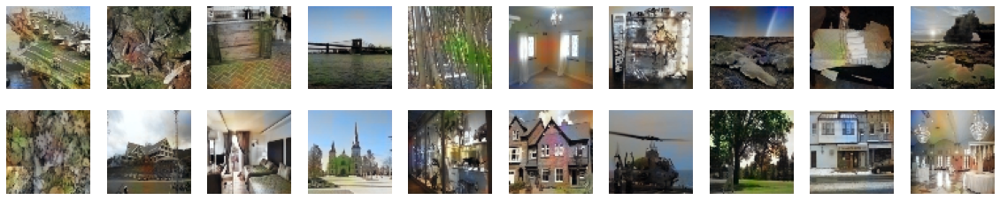

32/32 [==============================] - 0s 8ms/step - loss: 0.0032 - accuracy: 0.6118
Epoch 2/500 	loss:0.0009792426135390997 	accuracy:0.7145805358886719 	val_loss:0.0032101995311677456 	val_accuracy:0.6117995381355286

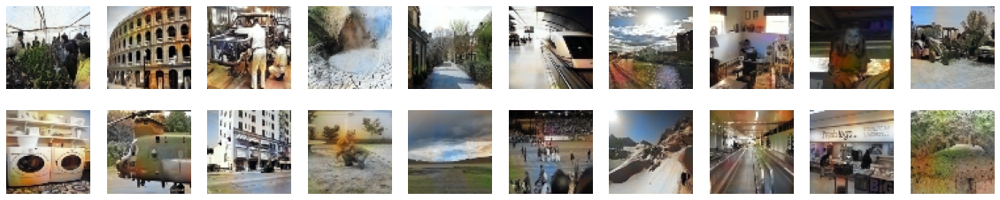

32/32 [==============================] - 0s 9ms/step - loss: 0.0031 - accuracy: 0.6103
Epoch 3/500 	loss:0.0009986557997763157 	accuracy:0.731536865234375 	val_loss:0.0031193711329251528 	val_accuracy:0.610265851020813

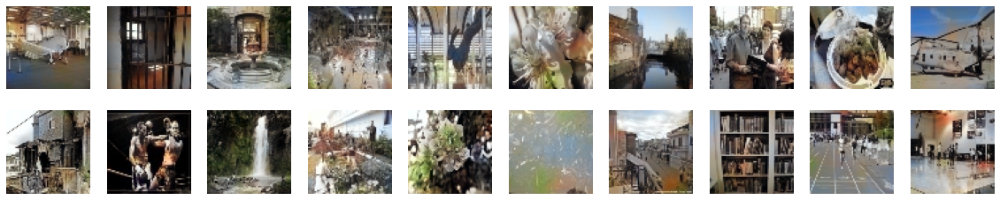

32/32 [==============================] - 0s 9ms/step - loss: 0.0031 - accuracy: 0.6097
Epoch 4/500 	loss:0.0011080460390076041 	accuracy:0.731475830078125 	val_loss:0.003079845104366541 	val_accuracy:0.6097148656845093

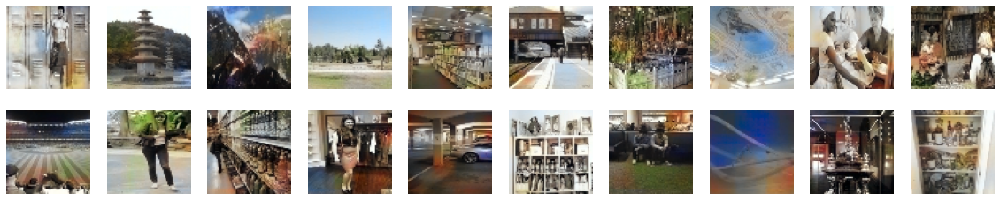

32/32 [==============================] - 0s 9ms/step - loss: 0.0032 - accuracy: 0.6148
Epoch 5/500 	loss:0.000911455019377172 	accuracy:0.7196273803710938 	val_loss:0.003223699750378728 	val_accuracy:0.6148478984832764

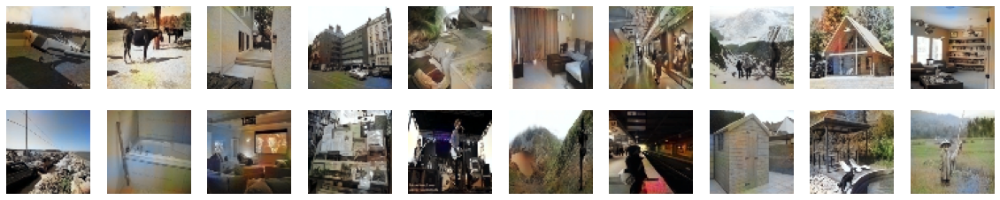

32/32 [==============================] - 0s 8ms/step - loss: 0.0031 - accuracy: 0.6161
Epoch 6/500 	loss:0.0008578646811656654 	accuracy:0.7217254638671875 	val_loss:0.003084097756072879 	val_accuracy:0.61606764793396

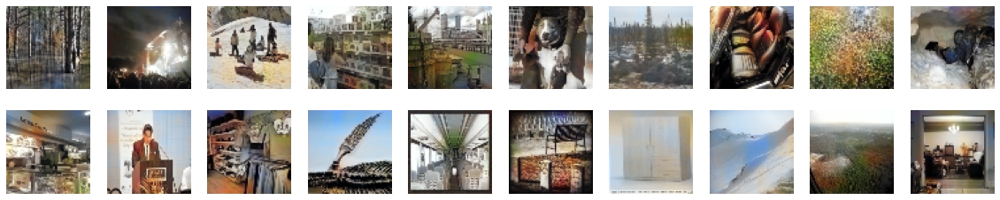

32/32 [==============================] - 0s 9ms/step - loss: 0.0031 - accuracy: 0.6119
Epoch 7/500 	loss:0.0011434195330366492 	accuracy:0.7458000183105469 	val_loss:0.0030868242029100657 	val_accuracy:0.611855685710907

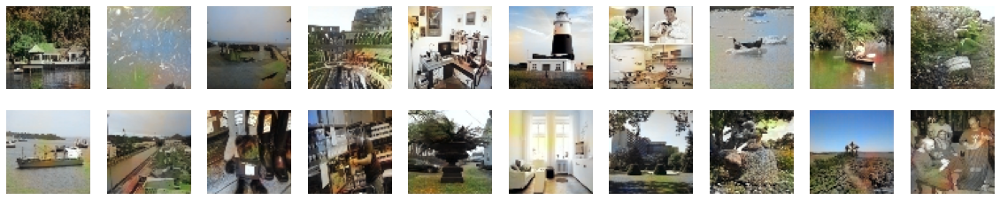

32/32 [==============================] - 0s 8ms/step - loss: 0.0032 - accuracy: 0.6193
Epoch 8/500 	loss:0.0011400701478123665 	accuracy:0.7301292419433594 	val_loss:0.0032257132697850466 	val_accuracy:0.6193197965621948

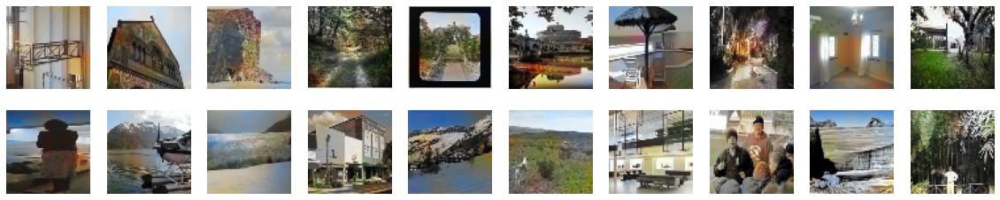

32/32 [==============================] - 0s 9ms/step - loss: 0.0030 - accuracy: 0.6100
Epoch 9/500 	loss:0.0008508979226462543 	accuracy:0.7165451049804688 	val_loss:0.002995729213580489 	val_accuracy:0.6099579930305481

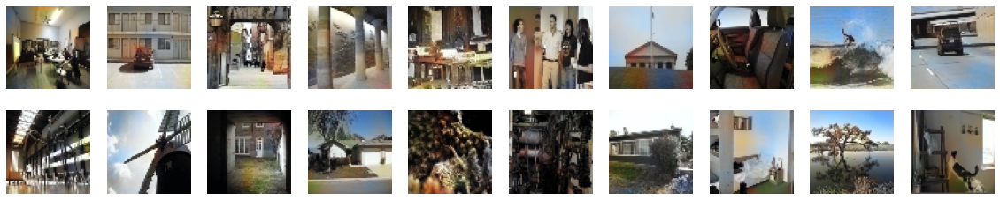

32/32 [==============================] - 0s 8ms/step - loss: 0.0031 - accuracy: 0.6125
Epoch 10/500 	loss:0.00120312231592834 	accuracy:0.7367973327636719 	val_loss:0.003126728581264615 	val_accuracy:0.6125410199165344

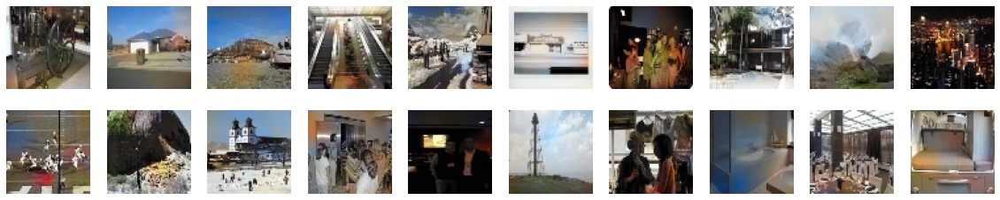

32/32 [==============================] - 0s 9ms/step - loss: 0.0032 - accuracy: 0.6210
Epoch 11/500 	loss:0.0010140109807252884 	accuracy:0.7730979919433594 	val_loss:0.003170485608279705 	val_accuracy:0.621008038520813

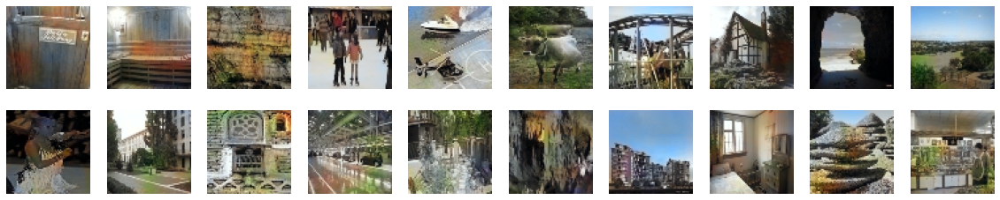

32/32 [==============================] - 0s 9ms/step - loss: 0.0030 - accuracy: 0.6119
Epoch 12/500 	loss:0.001041981391608715 	accuracy:0.7242279052734375 	val_loss:0.0029893075115978718 	val_accuracy:0.6119404435157776

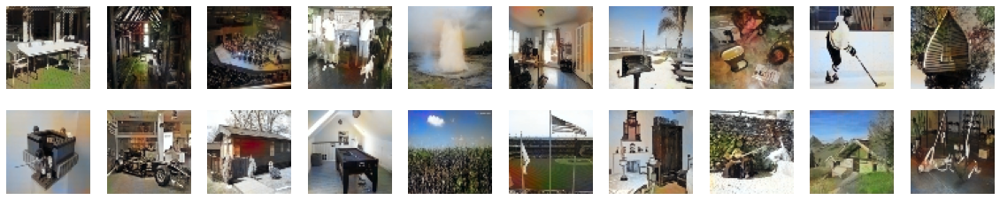

32/32 [==============================] - 0s 8ms/step - loss: 0.0033 - accuracy: 0.6178
Epoch 13/500 	loss:0.0009226787369698286 	accuracy:0.7404403686523438 	val_loss:0.003326085861772299 	val_accuracy:0.6177534461021423

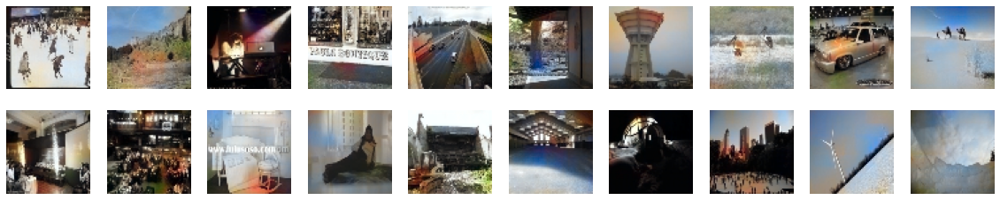

32/32 [==============================] - 0s 9ms/step - loss: 0.0032 - accuracy: 0.5927
Epoch 14/500 	loss:0.0010245339944958687 	accuracy:0.7318115234375 	val_loss:0.0032347580417990685 	val_accuracy:0.5926547646522522

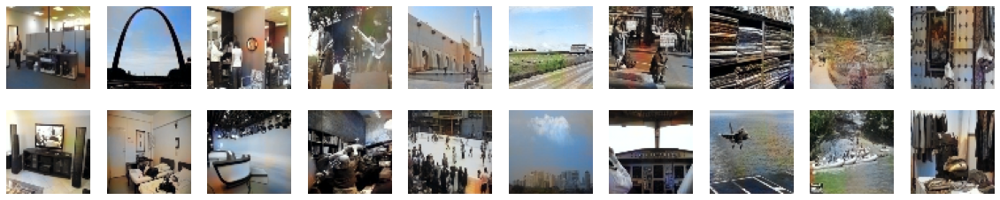

32/32 [==============================] - 0s 9ms/step - loss: 0.0033 - accuracy: 0.6026
Epoch 15/500 	loss:0.0008525839075446129 	accuracy:0.7656440734863281 	val_loss:0.0032878387719392776 	val_accuracy:0.6026298999786377

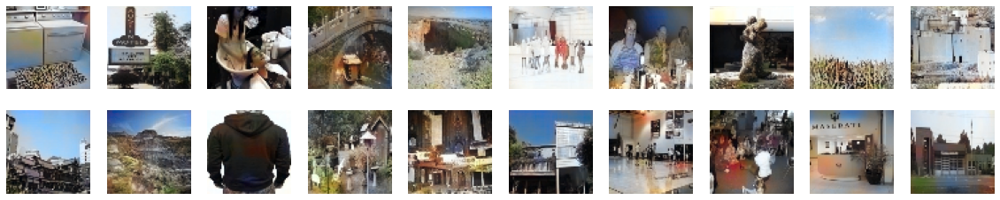

32/32 [==============================] - 0s 8ms/step - loss: 0.0032 - accuracy: 0.6170
Epoch 16/500 	loss:0.0009065901394933462 	accuracy:0.7168312072753906 	val_loss:0.003178760875016451 	val_accuracy:0.6170295476913452

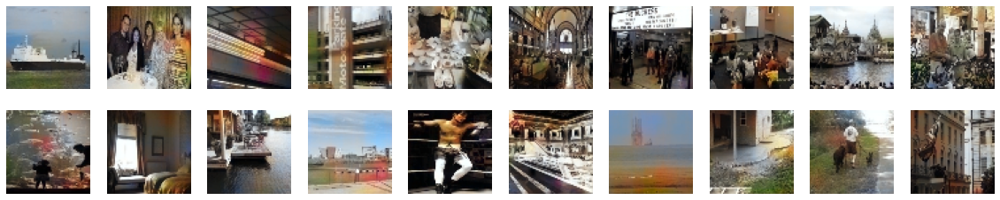

32/32 [==============================] - 0s 9ms/step - loss: 0.0031 - accuracy: 0.6146
Epoch 17/500 	loss:0.0009968456579372287 	accuracy:0.7713279724121094 	val_loss:0.0030562959145754576 	val_accuracy:0.6146274209022522

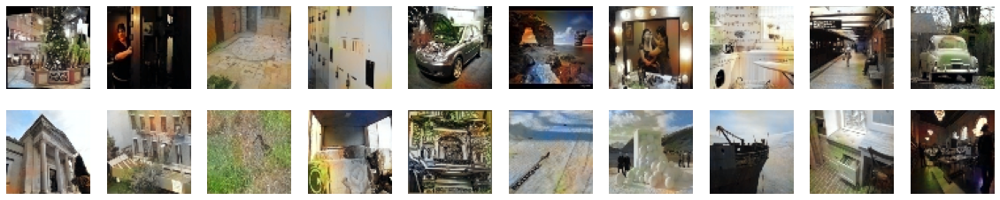

32/32 [==============================] - 0s 9ms/step - loss: 0.0032 - accuracy: 0.6146
Epoch 18/500 	loss:0.0010375455021858215 	accuracy:0.7329559326171875 	val_loss:0.0032333440613001585 	val_accuracy:0.6146355271339417

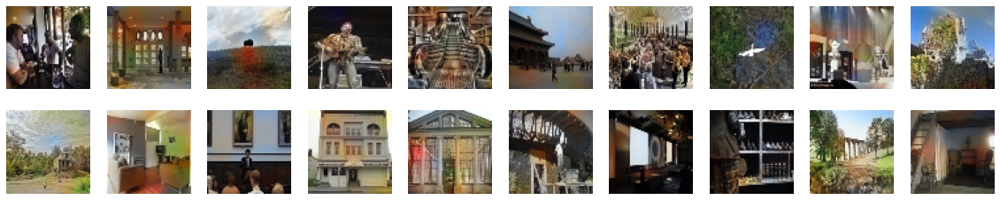

32/32 [==============================] - 0s 9ms/step - loss: 0.0033 - accuracy: 0.6117
Epoch 19/500 	loss:0.0009049470536410809 	accuracy:0.7422599792480469 	val_loss:0.003325785743072629 	val_accuracy:0.6117067933082581

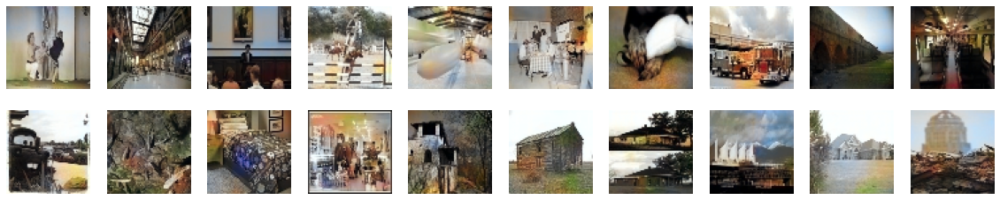

32/32 [==============================] - 0s 9ms/step - loss: 0.0032 - accuracy: 0.6030
Epoch 20/500 	loss:0.000878098071552813 	accuracy:0.7478485107421875 	val_loss:0.0031561576761305332 	val_accuracy:0.6030356287956238

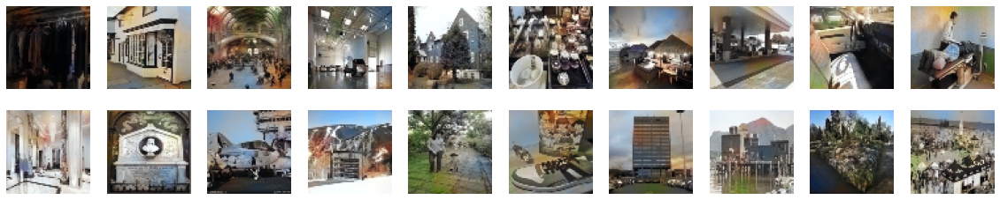

32/32 [==============================] - 0s 8ms/step - loss: 0.0033 - accuracy: 0.6081
Epoch 21/500 	loss:0.0008112689247354865 	accuracy:0.7252120971679688 	val_loss:0.0033018372487276793 	val_accuracy:0.6080912947654724

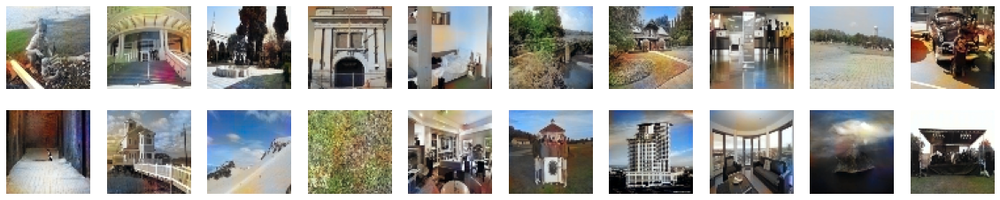

32/32 [==============================] - 0s 9ms/step - loss: 0.0032 - accuracy: 0.6014
Epoch 22/500 	loss:0.0009408046607859433 	accuracy:0.7116737365722656 	val_loss:0.0032116121146827936 	val_accuracy:0.6013920903205872

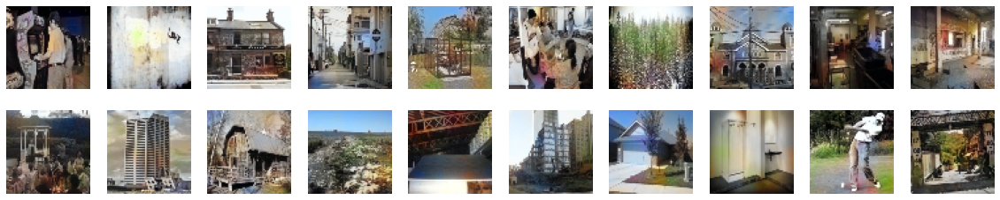

32/32 [==============================] - 0s 8ms/step - loss: 0.0030 - accuracy: 0.6141
Epoch 23/500 	loss:0.0008172874804586172 	accuracy:0.7065238952636719 	val_loss:0.003023051656782627 	val_accuracy:0.6140737533569336

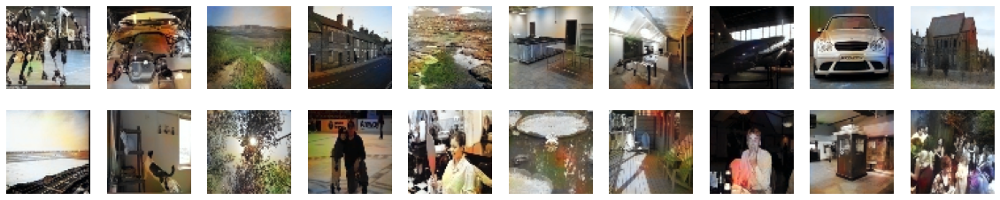

32/32 [==============================] - 0s 8ms/step - loss: 0.0032 - accuracy: 0.6082
Epoch 24/500 	loss:0.0007942598895169795 	accuracy:0.7579803466796875 	val_loss:0.003215335076674819 	val_accuracy:0.608184814453125

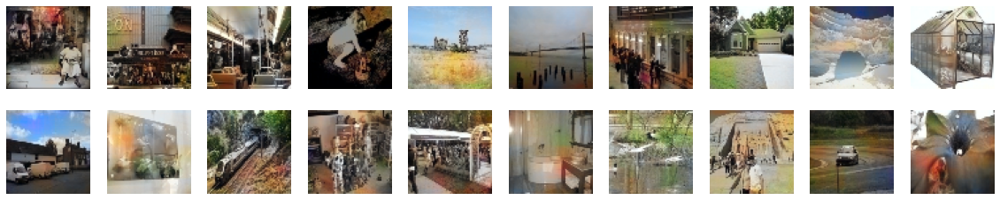

32/32 [==============================] - 0s 8ms/step - loss: 0.0033 - accuracy: 0.6145
Epoch 25/500 	loss:0.0008540480630472302 	accuracy:0.7336273193359375 	val_loss:0.0032616574317216873 	val_accuracy:0.6144506931304932

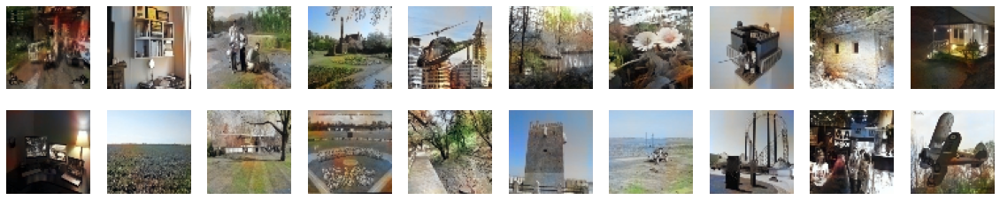

32/32 [==============================] - 0s 9ms/step - loss: 0.0031 - accuracy: 0.6101
Epoch 26/500 	loss:0.0009610919514670968 	accuracy:0.7487602233886719 	val_loss:0.003097057342529297 	val_accuracy:0.6101388931274414

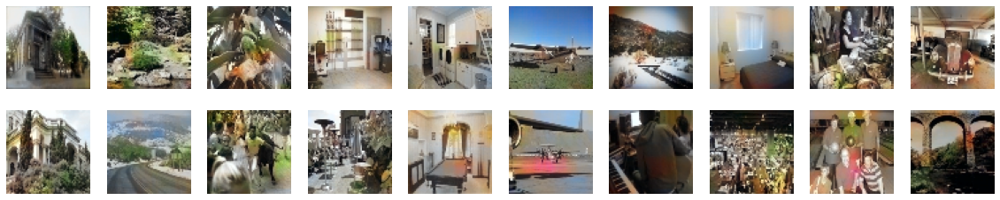

32/32 [==============================] - 0s 8ms/step - loss: 0.0032 - accuracy: 0.6135
Epoch 27/500 	loss:0.0008830082369968295 	accuracy:0.7516403198242188 	val_loss:0.0032003128435462713 	val_accuracy:0.6134682893753052

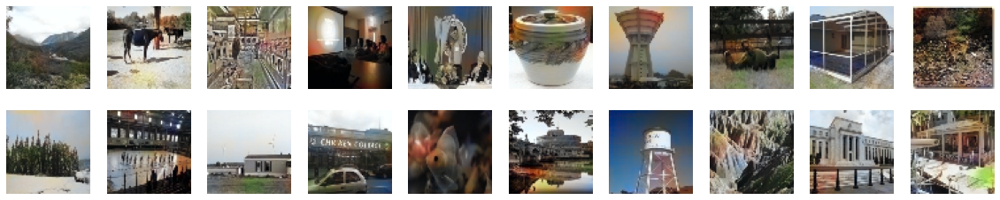

32/32 [==============================] - 0s 8ms/step - loss: 0.0031 - accuracy: 0.6100
Epoch 28/500 	loss:0.0009013015078380704 	accuracy:0.7439422607421875 	val_loss:0.003130977973341942 	val_accuracy:0.6100427508354187

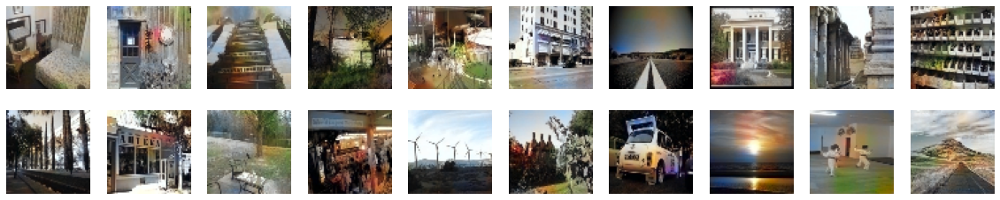

32/32 [==============================] - 0s 8ms/step - loss: 0.0033 - accuracy: 0.6003
Epoch 29/500 	loss:0.0010668152244761586 	accuracy:0.7374305725097656 	val_loss:0.003305636113509536 	val_accuracy:0.6002963781356812

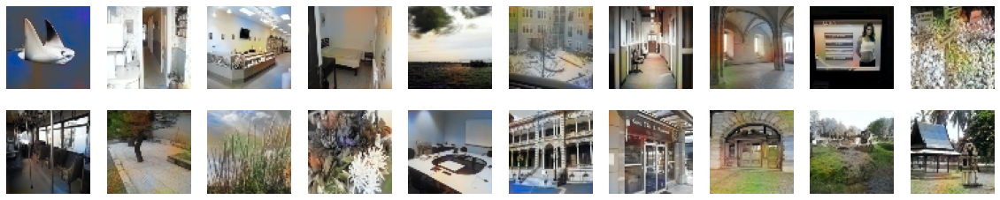

32/32 [==============================] - 0s 8ms/step - loss: 0.0033 - accuracy: 0.6070
Epoch 30/500 	loss:0.0008759255288168788 	accuracy:0.7569313049316406 	val_loss:0.0033258923795074224 	val_accuracy:0.6070082783699036

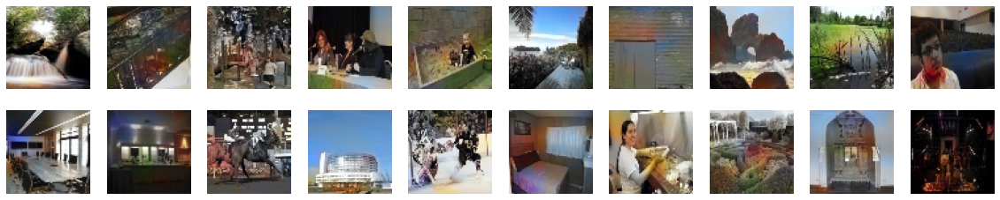

32/32 [==============================] - 0s 8ms/step - loss: 0.0032 - accuracy: 0.6231
Epoch 31/500 	loss:0.0007796717109158635 	accuracy:0.7602920532226562 	val_loss:0.0032001864165067673 	val_accuracy:0.6231491565704346

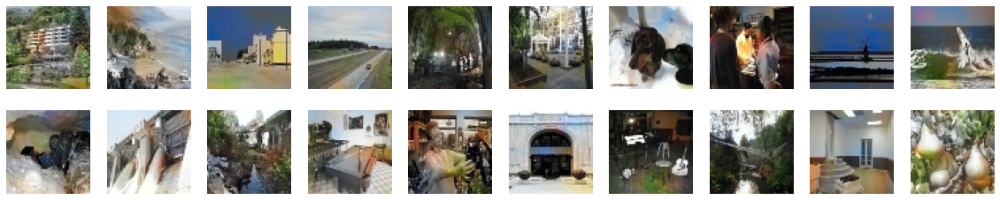

32/32 [==============================] - 0s 8ms/step - loss: 0.0033 - accuracy: 0.6106
Epoch 32/500 	loss:0.0006280561210587621 	accuracy:0.7469825744628906 	val_loss:0.003266002517193556 	val_accuracy:0.610641598701477

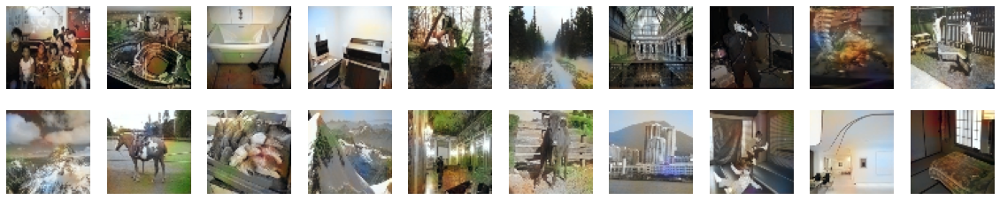

277/456 Epoch 33/500 	loss:0.0008273981511592865 	accuracy:0.7568321228027344

In [ ]:
hist = {
    "loss":[],
    "accuracy":[],
    "val_loss":[],
    "val_accuracy":[]
}
for epoch in range(epochs):
  for batch_i in range(num_batches):
    L_train, AB_train = next(train_gen)
    # Convert AB to one hot and concatenate
    # A_train_onehot = convert_channel_to_onehot(img_single_channel=AB_train[:,:,:,0], bins=COLOR_BINS)
    # B_train_onehot = convert_channel_to_onehot(img_single_channel=AB_train[:,:,:,1], bins=COLOR_BINS)
    # AB_train_onehot = np.concatenate([A_train_onehot, B_train_onehot], axis=-1)

    loss, accuracy = model.train_on_batch(L_train, AB_train)
    # loss, accuracy = model.train_on_batch(L_train, AB_train)
    sys.stdout.write("\r{}/{} Epoch {}/{} \tloss:{} \taccuracy:{}".format(batch_i+1, num_batches, epoch+1, epochs, loss, accuracy))
    sys.stdout.flush()
  L_val, AB_val = next(val_gen)
  # A_val_onehot = convert_channel_to_onehot(img_single_channel=AB_val[:,:,:,0], bins=COLOR_BINS)
  # B_val_onehot = convert_channel_to_onehot(img_single_channel=AB_val[:,:,:,1], bins=COLOR_BINS)
  # AB_val_onehot = np.concatenate([A_val_onehot, B_val_onehot], axis=-1)

  val_loss, val_accuracy = model.evaluate(L_val, AB_val)
  sys.stdout.write("\rEpoch {}/{} \tloss:{} \taccuracy:{} \tval_loss:{} \tval_accuracy:{}"\
                   .format(epoch+1, epochs, loss, accuracy, val_loss, val_accuracy))
  sys.stdout.flush()
  hist["loss"].append(loss)
  hist["accuracy"].append(accuracy)
  hist["val_loss"].append(val_loss)
  hist["val_accuracy"].append(val_accuracy)

  # Plot predicted images.
  AB_val_pred = model.predict(L_val)
  # num_classes = len(COLOR_BINS) - 1
  # A_val_pred_single_channel = convert_onehot_to_channel(img_onehot=AB_val_pred[:,:,:,:num_classes], bins=COLOR_BINS)
  # B_val_pred_single_channel = convert_onehot_to_channel(img_onehot=AB_val_pred[:,:,:,num_classes:], bins=COLOR_BINS)

  # A_val_pred_single_channel = A_val_pred_single_channel.reshape(A_val_pred_single_channel.shape[0],
  #                                                               A_val_pred_single_channel.shape[1],
  #                                                               A_val_pred_single_channel.shape[2],
  #                                                               1)
  # B_val_pred_single_channel = B_val_pred_single_channel.reshape(B_val_pred_single_channel.shape[0],
  #                                                               B_val_pred_single_channel.shape[1],
  #                                                               B_val_pred_single_channel.shape[2],
  #                                                               1)
  # AB_val_pred_double_channel = np.concatenate([A_val_pred_single_channel, B_val_pred_single_channel], axis=3)

  LAB_pred = np.concatenate([L_val, AB_val_pred], axis=3)
  #LAB_pred = np.concatenate([L_val, AB_val_pred], axis=3)
  LAB_pred = LAB_pred * 255.0

  RGB_pred = [cv2.cvtColor(x.astype(np.uint8), cv2.COLOR_LAB2RGB) for x in LAB_pred]
  RGB_pred = np.array(RGB_pred)
  plot_images(list(RGB_pred.astype(np.uint8))[:20])
  #print("LAB_Pred:", LAB_pred.shape)

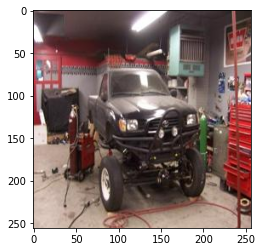

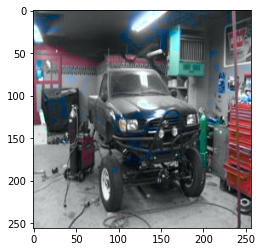

In [242]:
img_bgr = cv2.imread(image_paths_train[0], cv2.IMREAD_COLOR)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
plt.imshow(img_rgb)
plt.show()

img_lab = img_lab / 255.0
L = img_lab[:,:,0]
A_onehot = convert_channel_to_onehot(img_lab[:,:,1], COLOR_BINS)
B_onehot = convert_channel_to_onehot(img_lab[:,:,2], COLOR_BINS)
AB_onehot = np.concatenate([A_onehot, B_onehot], axis=2)

A_single_channel =  convert_onehot_to_channel(AB_onehot[:,:,:10], COLOR_BINS)
B_single_channel =  convert_onehot_to_channel(AB_onehot[:,:,10:], COLOR_BINS)

A_single_channel = A_single_channel.reshape(A_single_channel.shape[0],A_single_channel.shape[1],1)
B_single_channel = B_single_channel.reshape(B_single_channel.shape[0],B_single_channel.shape[1],1)
AB_double_channel = np.concatenate([A_single_channel,B_single_channel ], axis=2)
LAB_generated = np.concatenate([L.reshape(L.shape[0], L.shape[1], 1), AB_double_channel], axis=2)
LAB_generated = LAB_generated * 255
RGB_generated = cv2.cvtColor(LAB_generated.astype(np.uint8), cv2.COLOR_LAB2RGB)
plt.imshow(RGB_generated.astype(np.uint8))
plt.show()


In [172]:
bins = np.arange(0,1.1, 0.1)
arr = np.random.uniform(size=(3,2,2))
arr_digitized = np.digitize(arr, bins)
arr_onehot = tf.one_hot(indices=arr_digitized-1, depth=10)
print(bins)
print(arr)
print(arr_digitized)
print(arr_onehot)

arr_digitized = np.argmax(arr_onehot, axis=-1)
# arr_digitized[arr_digitized==0] = 10
arr = arr_digitized / (len(bins)-1)

print(arr_digitized)
print(arr)

[0.  0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]
[[[0.32668177 0.17601911]
  [0.58552833 0.54317894]]

 [[0.52132659 0.75752486]
  [0.88221699 0.75804608]]

 [[0.07064334 0.73862196]
  [0.51703618 0.04933336]]]
[[[4 2]
  [6 6]]

 [[6 8]
  [9 8]]

 [[1 8]
  [6 1]]]
tf.Tensor(
[[[[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
   [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]]]


 [[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]

  [[0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
   [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]]


 [[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]]

  [[0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
   [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]]], shape=(3, 2, 2, 10), dtype=float32)
[[[3 1]
  [5 5]]

 [[5 7]
  [8 7]]

 [[0 7]
  [5 0]]]
[[[0.3 0.1]
  [0.5 0.5]]

 [[0.5 0.7]
  [0.8 0.7]]

 [[0.  0.7]
  [0.5 0. ]]]


In [181]:
a = np.random.randn(2,2)
b = np.random.randn(2,2)
np.array([a,b]).shape

(2, 2, 2)

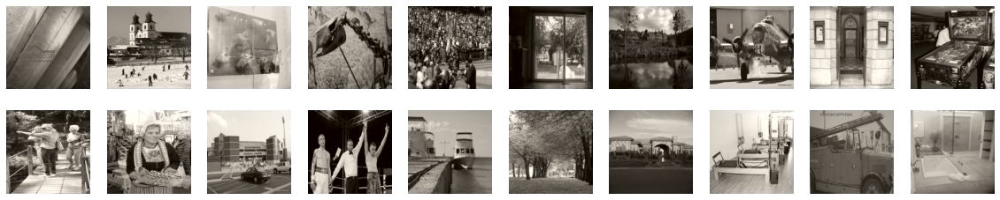

In [135]:
RGB_pred = [cv2.cvtColor(x.astype(np.uint8), cv2.COLOR_LAB2RGB) for x in LAB_pred]
RGB_pred = np.array(RGB_pred)

plot_images(list(RGB_pred.astype(np.uint8))[:20])

In [96]:
# train_ds = tf.data.Dataset.from_generator(lab_data_generator, 
#                                           args=[image_paths_train, IMAGE_SHAPE, batch_size, True], 
#                                           output_types=(tf.float32, tf.float32),
#                                           output_shapes=[(batch_size, IMAGE_SHAPE[0], IMAGE_SHAPE[1], 1), (batch_size,IMAGE_SHAPE[0], IMAGE_SHAPE[1], 2)])
# val_ds = tf.data.Dataset.from_generator(lab_data_generator, 
#                                           args=[image_paths_val, IMAGE_SHAPE, batch_size, True], 
#                                           output_types=(tf.float32, tf.float32),
#                                           output_shapes=[(batch_size,IMAGE_SHAPE[0], IMAGE_SHAPE[1], 1), (batch_size,IMAGE_SHAPE[0], IMAGE_SHAPE[1], 2)])

In [ ]:
model = model_autoencoder(input_shape=[IMAGE_SHAPE[0], IMAGE_SHAPE[1], 1], opt=opt, loss="mse") 
model.summary()

In [93]:
hist = model.fit(train_ds, validation_data=val_ds, batch_size=32, epochs=10)

Epoch 1/10


ValueError: ignored

## 1. Rescaling images

In [ ]:
# print(L.shape)
# L = [cv2.resize(img, (IMAGE_SHAPE[1], IMAGE_SHAPE[0])) for img in L]
# L = np.concatenate(L, axis=0)
# print(L.shape)

In [ ]:
# AB_min = np.min(AB)
# AB_max = np.max(AB)

# data_gen=data_generator(L, AB, AB_min, AB_max, batch_size, normalize=True)

In [13]:
# L = L.reshape(L.shape[0], L.shape[1], L.shape[2], 1)
# AB = AB

# L_train, L_val, AB_train, AB_val = train_test_split(L, AB, test_size = 0.1)

# print("Train data:", L_train.shape, AB_train.shape)
# print("Validation data:", L_val.shape, AB_val.shape)

Train data: (9000, 224, 224, 1) (9000, 224, 224, 2)
Validation data: (1000, 224, 224, 1) (1000, 224, 224, 2)
